In [83]:
library(ggplot2)
library(dplyr)
library(Matrix)
library(data.table)
library(stringr)
library(patchwork)
library(glue)
library(ggforce)
library(vcfR)
library(purrr)
library(magrittr)
library(parallel)
library(igraph)
library(ggrepel)
library(ape)
library(tidygraph)
library(ggtree)
library(ggpubr)
library(extraDistr)
library(IRdisplay)
library(ggridges)
library(logger)

In [84]:
R.utils::sourceDirectory('~/numbat/R')

In [1123]:
options(repr.plot.width = 14, repr.plot.height = 2.5, repr.plot.res = 200)

bulk = get_bulk(
  count_mat = count_mat_ATC2,
  df_allele = df_allele_ATC2,
  lambdas_ref = ref_hca,
  gtf = gtf_hg38,
  genetic_map = genetic_map_hg38
)

expect_true(length(bulk) > 0)

message('running HMM..')

bulk = analyze_bulk(bulk, t = 1e-5)

number of genes left: 10137

running HMM..

Retesting CNVs..

Finishing..



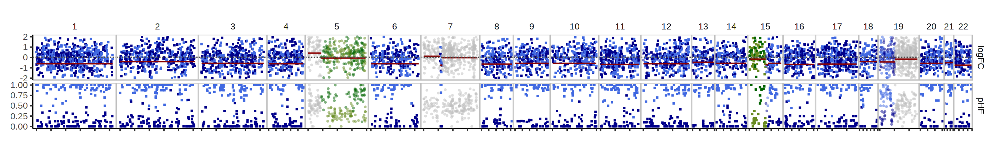

In [7]:
options(repr.plot.width = 14, repr.plot.height = 2, repr.plot.res = 200)

bulk %>% plot_bulks()

In [8]:
bulk_chr = bulk %>% filter(CHROM == 5) %>% filter(!is.na(pAD))

Warning message:
“Removed 62 row(s) containing missing values (geom_path).”


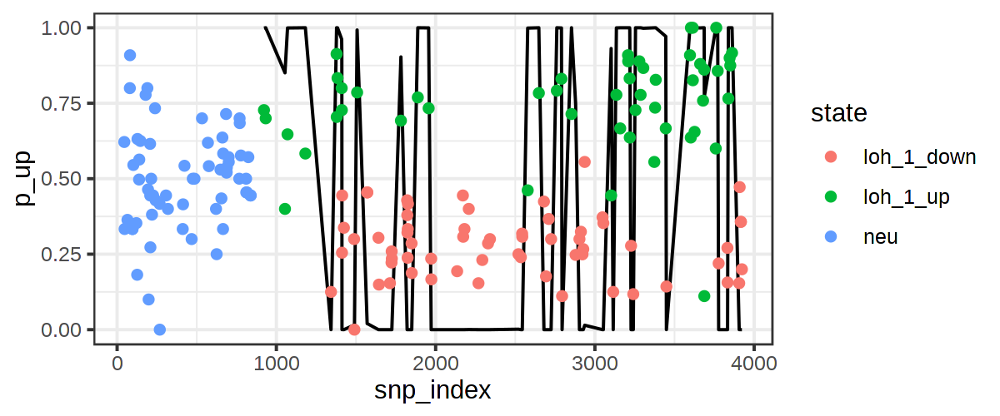

In [9]:
options(repr.plot.width = 6, repr.plot.height = 2.5, repr.plot.res = 200)

bulk_chr %>%
filter(DP > 8) %>%
ggplot(
) +
geom_line(
    inherit.aes = F,
    aes(x = snp_index, y = p_up)
) +
geom_point(aes(x = snp_index, y = pBAF, color = state)) +
theme_bw()

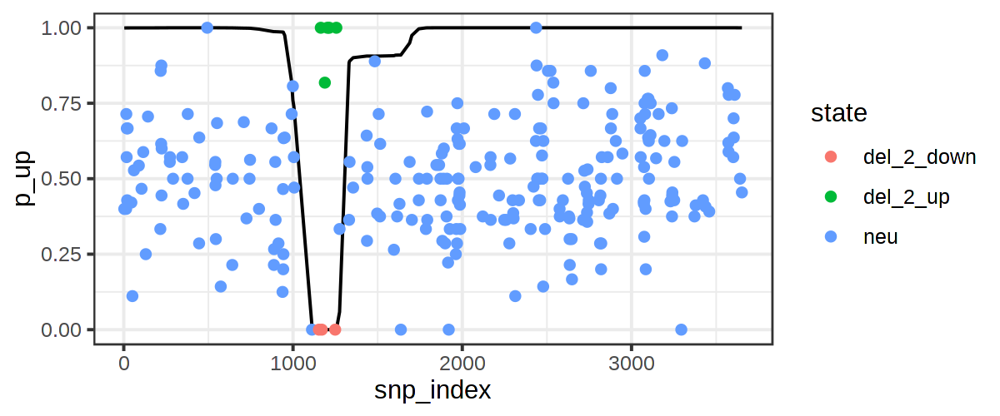

In [63]:
options(repr.plot.width = 6, repr.plot.height = 2.5, repr.plot.res = 200)
R.utils::sourceDirectory('~/numbat/R')

bulk %>%
filter(CHROM == 7) %>%
mutate(p_up = forward_back_allele(get_single_allele_hmm(pAD, DP, p_s, t = 1e-5, theta_min = 0.15))[,'neu']) %>%
filter(DP > 6) %>%
ggplot(
) +
geom_line(
    inherit.aes = F,
    aes(x = snp_index, y = p_up)
) +
geom_point(aes(x = snp_index, y = pBAF, color = state)) +
theme_bw()

In [46]:
# options(repr.plot.width = 6, repr.plot.height = 2.5, repr.plot.res = 200)
# R.utils::sourceDirectory('~/numbat/R')

# bulk %>%
# filter(CHROM == 7) %>%
# mutate(p_up = forward_back_allele(get_allele_treehmm(pAD, DP, p_s, Q, pa = 1, t = 1e-4, theta_min = 0.08))[,'neu']) %>%
# mutate(state = viterbi_allele(get_allele_treehmm(pAD, DP, p_s, Q, pa = 1, t = 1e-4, theta_min = 0.08))$y) %>%
# filter(DP > 6) %>%
# ggplot(
# ) +
# geom_line(
#     inherit.aes = F,
#     aes(x = snp_index, y = p_up)
# ) +
# geom_point(aes(x = snp_index, y = pBAF, color = state)) +
# theme_bw()

In [330]:
R.utils::sourceDirectory('~/numbat/R')

pAD = bulk_chr$pAD
DP = bulk_chr$DP
p_s = bulk_chr$p_s
t = 1e-3
gamma = 20

hmm = get_single_allele_hmm(pAD, DP, p_s, t = 1e-5, theta_min = 0.19, gamma = 20)
Q = forward_back_allele(hmm)
# node marginals Q[[i]][t,z_t]
Q = list(Q,Q)

In [85]:
bulk_clones = fread('~/paper_data/numbat_out/27522/bulk_clones_2.tsv.gz')

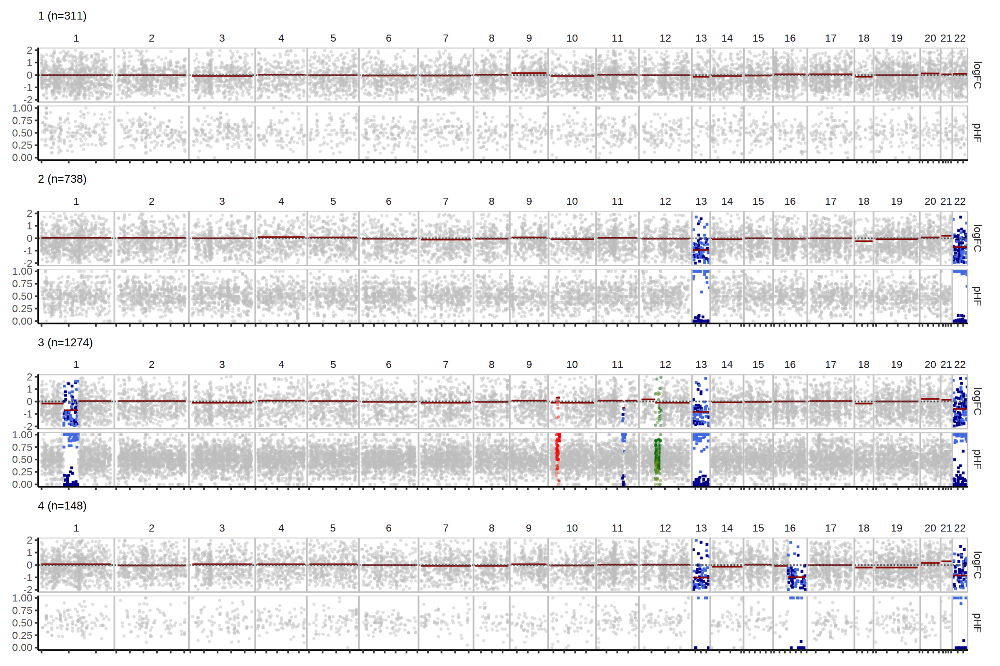

In [348]:
options(repr.plot.width = 12, repr.plot.height = 8, repr.plot.res = 200)

bulk_clones %>% 
plot_bulks()

In [534]:
R.utils::sourceDirectory('~/numbat/R')

Q1 = D %>% {get_single_allele_hmm(.$pAD_1, .$DP_1, .$p_s, theta_min = 0.15)} %>% forward_back_allele()
Q2 = D %>% {get_single_allele_hmm(.$pAD_2, .$DP_2, .$p_s, theta_min = 0.15)} %>% forward_back_allele()

Q = list(Q1, Q2)

In [552]:
Q = rbind(
    rep(0.99, nrow(D)),
    rep(0.005, nrow(D)),
    rep(0.005, nrow(D))
) %>%
t

hmm = D %>% {get_allele_treehmm(.$pAD_1, .$DP_1, .$p_s, Q = list(Q), pa = 1, theta_min = 0.15)}

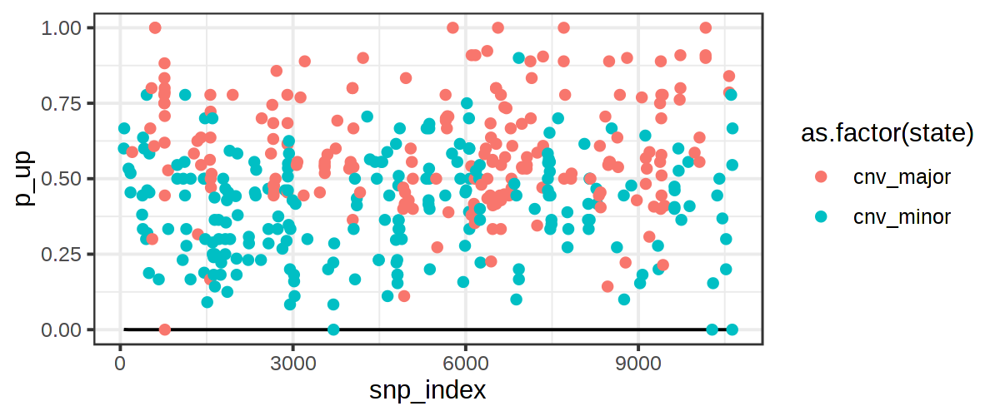

In [553]:
options(repr.plot.width = 6, repr.plot.height = 2.5, repr.plot.res = 200)
R.utils::sourceDirectory('~/numbat/R')

D %>% 
mutate(pBAF = pAD_1/DP_1) %>%
mutate(
    p_up = forward_back_allele(hmm)[,'neu'],
    state = c('neu', 'cnv_major', 'cnv_minor')[viterbi_allele(hmm)]
) %>%
filter(DP_1 > 8) %>%
ggplot(
) +
geom_line(
    inherit.aes = F,
    aes(x = snp_index, y = p_up)
) +
geom_point(aes(x = snp_index, y = pBAF, color = as.factor(state))) +
theme_bw()

In [499]:
R.utils::sourceDirectory('~/numbat/R')

bulk = bulks %>% filter(sample == 2 & CHROM == 1) %>% mutate(snp_index = 1:n())

bulks_param = mclapply(
    mc.cores = 5,
    seq(2, 20, 4),
    function(gam) {
        lapply(
            seq(0.04, 0.16, 0.04),
            function(theta) {

                hmm = bulk %>% {
                    get_single_allele_hmm(
                        .$pAD, .$DP, .$p_s,
                        t = 1e-5,
                        theta_min = theta, 
                        gamma = gam,
                        prior = c(1,1,1))
                }

                bulk$state = c('neu', 'cnv_major', 'cnv_minor')[viterbi_allele(hmm)]
                Q = forward_back_allele_R(hmm)
                bulk$p_neu = Q$marginals[,'neu']
                
                bulk$gamma = gam
                bulk$theta_min = theta
                
                return(bulk)
                
            }
        )
    }
) %>%
bind_rows()

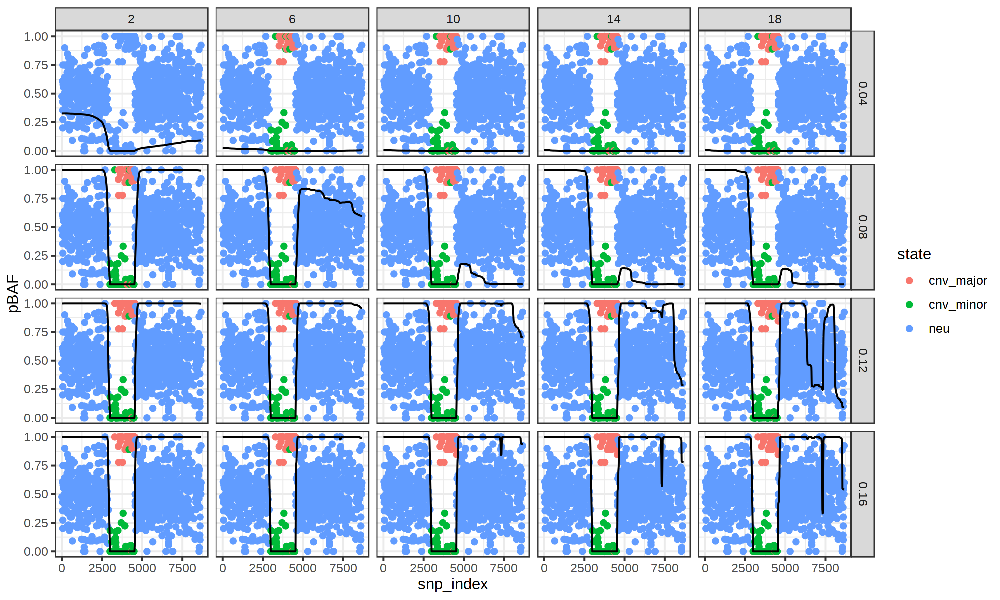

In [507]:
options(repr.plot.width = 10, repr.plot.height = 6, repr.plot.res = 200)

bulks_param %>%
filter(DP > 8) %>%
ggplot(
) +
geom_point(aes(x = snp_index, y = pBAF, color = state)) +
geom_line(
    inherit.aes = F,
    aes(x = snp_index, y = p_neu)
) +
facet_grid(theta_min~gamma) +
theme_bw() +
ylim(0,1)

In [86]:
options(repr.plot.width = 6, repr.plot.height = 2.5, repr.plot.res = 200)
R.utils::sourceDirectory('~/numbat/R')

bulk_chr = bulk %>% 
    filter(CHROM == 5) %>% 
    filter(!is.na(pAD)) %>%
    mutate(MAD = ifelse(AD/DP > 0.5, AD, DP - AD)) %>%
    mutate(snp_index = 1:n()) %>%
    mutate(p_s = 0)

hmm = bulk_chr %>% {get_single_allele_hmm(.$MAD, .$DP, .$p_s, theta_min = 0.45, theta_neu = 0.15, t = 1e-6)}

fb = forward_back_allele_R(hmm)

bulk_chr %>% 
mutate(
    p_neu = fb$marginals[,'neu'],
#     p_neu2 = fb$edge_marginals %>%
#         purrr::map(function(x){rowSums(x)['neu']}) %>%
#         unlist %>% unname %>% c(0),
    state = c('NEU', 'LOH(major)', 'LOH(minor)')[viterbi_allele(hmm)]
) %>%
filter(DP > 8) %>%
ggplot(
) +
geom_line(
    inherit.aes = F,
    aes(x = snp_index, y = p_neu)
) +
# geom_line(
#     inherit.aes = F,
#     aes(x = snp_index, y = p_neu2),
#     color = 'blue',
#     linetype = 'dashed',
#     size = 1
# ) +
geom_point(aes(x = snp_index, y = MAD/DP, color = state)) +
theme_bw() +
ylim(0,1) +
ylab('pHF')

ERROR: Error in filter(., CHROM == 5): object 'bulk' not found


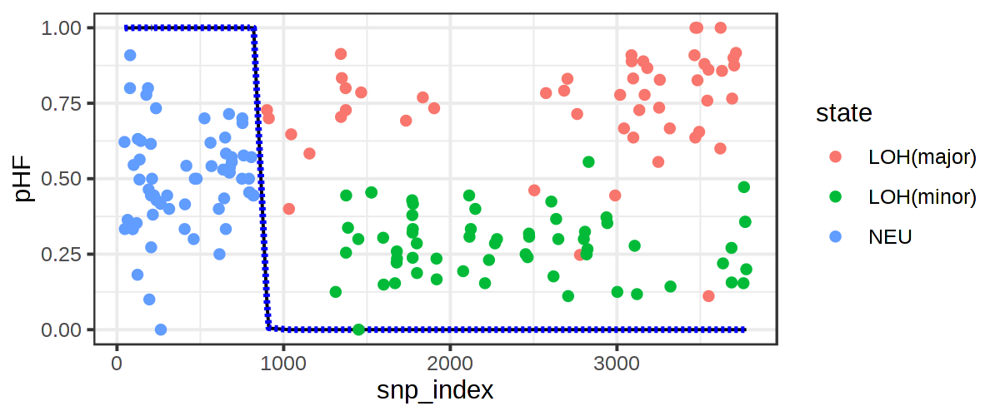

In [1207]:
options(repr.plot.width = 6, repr.plot.height = 2.5, repr.plot.res = 200)
R.utils::sourceDirectory('~/numbat/R')

bulk_chr = bulk %>% 
    filter(CHROM == 5) %>% 
    filter(!is.na(pAD)) %>%
    mutate(snp_index = 1:n())

hmm = bulk_chr %>% {get_single_allele_hmm(.$pAD, .$DP, .$p_s, theta_min = 0.2)}

fb = forward_back_allele_R(hmm)

bulk_chr %>% 
mutate(
    p_neu = fb$marginals[,'neu'],
    p_neu2 = rowSums(fb$edge_marginals, dims = 2)[,'neu'],
    state = c('NEU', 'LOH(major)', 'LOH(minor)')[viterbi_allele(hmm)]
) %>%
filter(DP > 8) %>%
ggplot(
) +
geom_line(
    inherit.aes = F,
    aes(x = snp_index, y = p_neu)
) +
geom_line(
    inherit.aes = F,
    aes(x = snp_index, y = p_neu2),
    color = 'blue',
    linetype = 'dashed',
    size = 1
) +
geom_point(aes(x = snp_index, y = pBAF, color = state)) +
theme_bw() +
ylim(0,1) +
ylab('pHF')

In [1508]:
R.utils::sourceDirectory('~/numbat/R')

bulk_chr = bulk %>% 
    filter(CHROM == 5) %>% 
    filter(!is.na(pAD))

p_s = bulk_chr$p_s
t = 1e-5
bigT = length(p_s)
Q0 = matrix(c(rep(1,bigT), rep(0,bigT), rep(0,bigT)), ncol = 3, nrow = bigT)
Q = c(Q0, fb$marginals) %>%
    array(dim = c(dim(fb$marginals), 2)) %>%
    aperm(c(3,1,2))
Q0_pair = array(rep(c(1,rep(0,8)), bigT), dim = c(3,3,bigT)) %>% aperm(c(3,1,2)) 
Q_pair = c(Q0_pair, fb$edge_marginals) %>% 
    array(c(dim(fb$edge_marginals), 2)) %>% aperm(c(4,1,2,3))
pa = 1
ch = c(3,4)

In [1488]:
logprob[1,,] = fb$logprob
logprob[2,,] = fb$logprob

In [1504]:
p_s = bulks %>% filter(sample == 1) %>% pull(p_s)

In [1513]:
R.utils::sourceDirectory('~/numbat/R')

logtheta = log(get_p_z(1e-5, p_s))

[1] 4501.302

In [1539]:
likelihood_term

[1] -4872.566

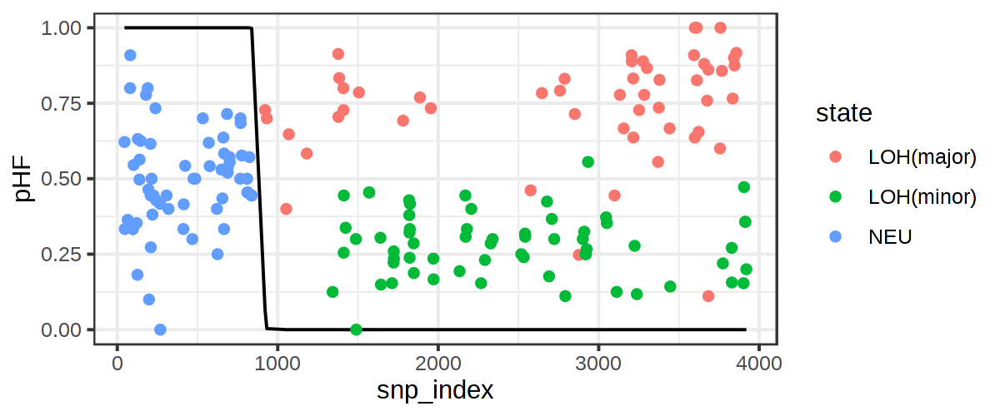

In [1172]:
options(repr.plot.width = 6, repr.plot.height = 2.5, repr.plot.res = 200)
R.utils::sourceDirectory('~/numbat/R')

alpha = 0.01

Q0 = matrix(c(rep(1-alpha,bigT), rep(alpha,bigT), rep(0,bigT)), ncol = 3, nrow = bigT)

Q = c(Q0, fb$marginals) %>%
    array(dim = c(dim(fb$marginals), 2)) %>%
    aperm(c(3,1,2))

treehmm = bulk_chr %>% {
    get_allele_treehmm(
        .$pAD, .$DP, .$p_s, 
        t = 1e-5,
        theta_min = 0.2,
        Q = Q, 
        Q_pair = Q_pair, 
        pa = 1,
        ch = NULL)}

bulk_chr %>% 
mutate(
    p_neu = forward_back_allele(treehmm)[,'neu'],
    state = c('NEU', 'LOH(major)', 'LOH(minor)')[viterbi_allele(treehmm)]
) %>%
filter(DP > 8) %>%
ggplot(
) +
geom_line(
    inherit.aes = F,
    aes(x = snp_index, y = p_neu)
) +
geom_point(aes(x = snp_index, y = pBAF, color = state)) +
theme_bw() +
ylim(0,1) +
ylab('pHF')

In [146]:
bulks = bulk_clones %>%
    filter(sample %in% c(2,3)) %>%
    arrange(sample) %>%
    mutate(sample = as.integer(factor(sample, unique(sample)))) %>%
    filter(CHROM == 11) %>%
    filter(!is.na(pAD)) %>%
    select(-phi_mle) %>%
    arrange(CHROM, POS) %>%
    mutate(snp_index = as.integer(factor(snp_id, unique(snp_id)))) %>%
    group_by(CHROM) %>%
    ungroup()

bulks_unified = bulks %>% select(sample, CHROM, POS, snp_id, snp_index, cM, pAD, DP, p_s) %>%
    tidyr::pivot_wider(names_from = "sample", "values_from" = c("pAD", "DP")) %>%
    mutate(
        inter_snp_cm = c(NA, cM[2:length(cM)] - cM[1:(length(cM)-1)]),
        p_s = switch_prob_cm(inter_snp_cm)
    ) %>%
    as.data.table() %>%
    melt(
        measure.vars = list(c('pAD_1', 'pAD_2'), c('DP_1', 'DP_2')),
        value.name = c('pAD', 'DP'),
        variable.name = 'sample'
    ) %>%
    mutate(pBAF = pAD/DP)

In [211]:
N = 1000
gamma = 20
theta = 0.8
cov = 30

bulks_sim = data.frame(
        POS = 1:N,
        snp_id = paste0('snp', 1:N),
        snp_index = 1:N,
        CHROM = 1,
        p_s = 1e-4
    ) %>%
    mutate(
        theta_1 = ifelse(POS > N/2, 0.65, 0.5),
        theta_1 = ifelse(POS > 2*N/3, 1-theta_1, theta_1),
        DP_1 = rpois(n = N, lambda = cov),
        pAD_1 = rbbinom(n = N, size = DP_1, alpha = theta_1*gamma, beta = (1-theta_1)*gamma),
        theta_2 = ifelse(POS > (N/2+50), 0.85, 0.5),
        theta_2 = ifelse(POS > 4*N/5, 1-theta_2, theta_2),
        DP_2 = rpois(n = N, lambda = cov),
        pAD_2 = rbbinom(n = N, size = DP_2, alpha = (1-theta_2)*gamma, beta = theta_2*gamma)
    ) %>%
    as.data.table() %>%
    melt(
        measure.vars = list(c('pAD_1', 'pAD_2'), c('DP_1', 'DP_2')),
        value.name = c('pAD', 'DP'),
        variable.name = 'sample'
    ) %>%
    mutate(pBAF = pAD/DP)

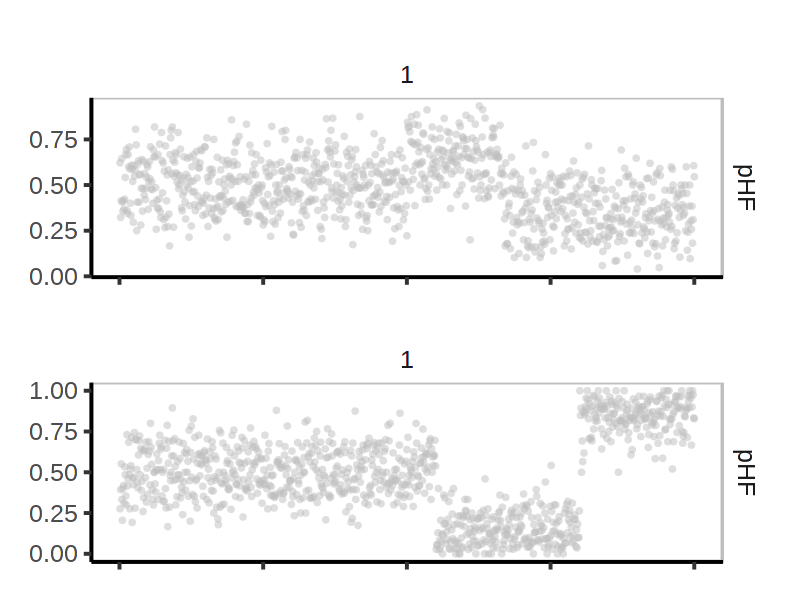

In [212]:
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 200)

bulks_sim %>% 
mutate(state = 'neu', cnv_state = 'neu', LLR = 0, logFC = 0) %>%
plot_bulks(phi_mle = FALSE, allele_only = TRUE)

In [224]:
R.utils::sourceDirectory('~/numbat/R')

res = run_treehmm(
    bulks_sim, 
    pa_dict = list(NULL,1),
    ch_dict = list(c(2), NULL),
    theta_min = 0.15,
    max_iter = 50,
    gamma = 5
)

iter 1

iter 2

iter 3

iter 4

iter 5

iter 6

iter 7

iter 8

iter 9

iter 10

iter 11

iter 12

iter 13

iter 14

iter 15

iter 16

iter 17

iter 18

iter 19

iter 20

iter 21

iter 22

iter 23

iter 24

iter 25

iter 26

iter 27

iter 28

iter 29

iter 30

iter 31

iter 32

iter 33

iter 34

iter 35

iter 36

iter 37

iter 38

iter 39

iter 40

iter 41

iter 42

iter 43

iter 44

iter 45

iter 46

iter 47

iter 48

iter 49

iter 50



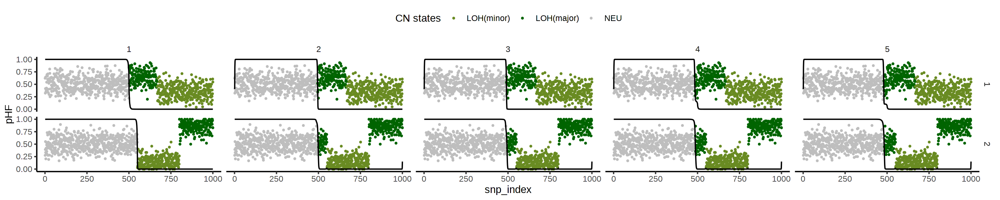

In [225]:
options(repr.plot.width = 15, repr.plot.height = 3, repr.plot.res = 200)

states = c('neu', 'loh_up', 'loh_down')

lapply(
    1:5,
    function(k) {
        
        bulks_sim %>% 
        group_by(sample) %>%
        mutate(
            state = states[res$S[k, unique(sample),]],
            p_neu = res$P[k, unique(sample),]
        ) %>%
        mutate(k = k)
        
    }
) %>% 
bind_rows() %>%
filter(DP > 8) %>%
ggplot(
) +
geom_point(aes(x = snp_index, y = pBAF, color = state), size = 0.5) +
geom_line(
    inherit.aes = F,
    aes(x = snp_index, y = p_neu)
) +
theme_classic() +
theme(
    strip.background = element_blank(),
    legend.position = 'top'
) +
facet_grid(sample~k) +
ylim(0,1) +
ylab('pHF') +
scale_color_manual(
    values = cnv_colors,
    labels = cnv_labels,
    name = 'CN states',
    limits = force
)

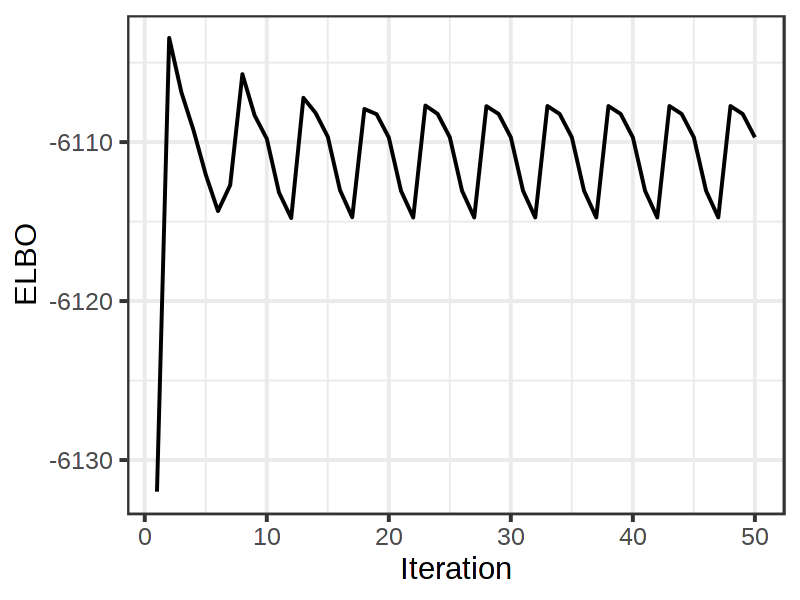

In [226]:
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 200)

data.frame(
    F = res$F
) %>%
mutate(iter = 1:n()) %>%
ggplot() +
geom_line(
    aes(x = iter, y = -F)
) +
ylab('ELBO') +
xlab('Iteration') +
theme_bw()

In [341]:
N = 1000
gamma = 20
theta = 0.8
cov = 30
offset = 80

bulks_sim = data.frame(
        POS = 1:N,
        snp_id = paste0('snp', 1:N),
        snp_index = 1:N,
        CHROM = 1,
        p_s = 1e-4
    ) %>%
    mutate(
        theta_1 = ifelse(POS > N/2, 0.65, 0.5),
        theta_1 = ifelse(POS > 2*N/3, 1-theta_1, theta_1),
        theta_1 = ifelse(POS > 3*N/4, 1-theta_1, theta_1),
        DP_1 = rpois(n = N, lambda = cov),
        pAD_1 = rbbinom(n = N, size = DP_1, alpha = theta_1*gamma, beta = (1-theta_1)*gamma),
        theta_2 = ifelse(POS > (N/2+offset), 0.85, 0.5),
#         theta_2 = ifelse(POS > N/2 & POS < (N/2+offset), 0.58, theta_2),
        theta_2 = ifelse(POS > 4*N/5, 1-theta_2, theta_2),
        theta_2 = ifelse(POS > 200 & POS < 300, 0.9, theta_2),
        DP_2 = rpois(n = N, lambda = cov),
        pAD_2 = rbbinom(n = N, size = DP_2, alpha = (1-theta_2)*gamma, beta = theta_2*gamma),
        theta_3 = ifelse(POS > (N/2+offset/2), 0.65, 0.5),
#         theta_3 = ifelse(POS > N/2 & POS < (N/2+offset/2), 0.58, theta_3),
        theta_3 = ifelse(POS > 2*N/3, 1-theta_3, theta_3),
        theta_3 = ifelse(POS > 100 & POS < 200, 0.9, theta_3),
        DP_3 = rpois(n = N, lambda = cov),
        pAD_3 = rbbinom(n = N, size = DP_3, alpha = theta_3*gamma, beta = (1-theta_3)*gamma)
    ) %>%
    as.data.table() %>%
    melt(
        measure.vars = list(c('pAD_1', 'pAD_2', 'pAD_3'), c('DP_1', 'DP_2', 'DP_3')),
        value.name = c('pAD', 'DP'),
        variable.name = 'sample'
    ) %>%
    mutate(pBAF = pAD/DP)

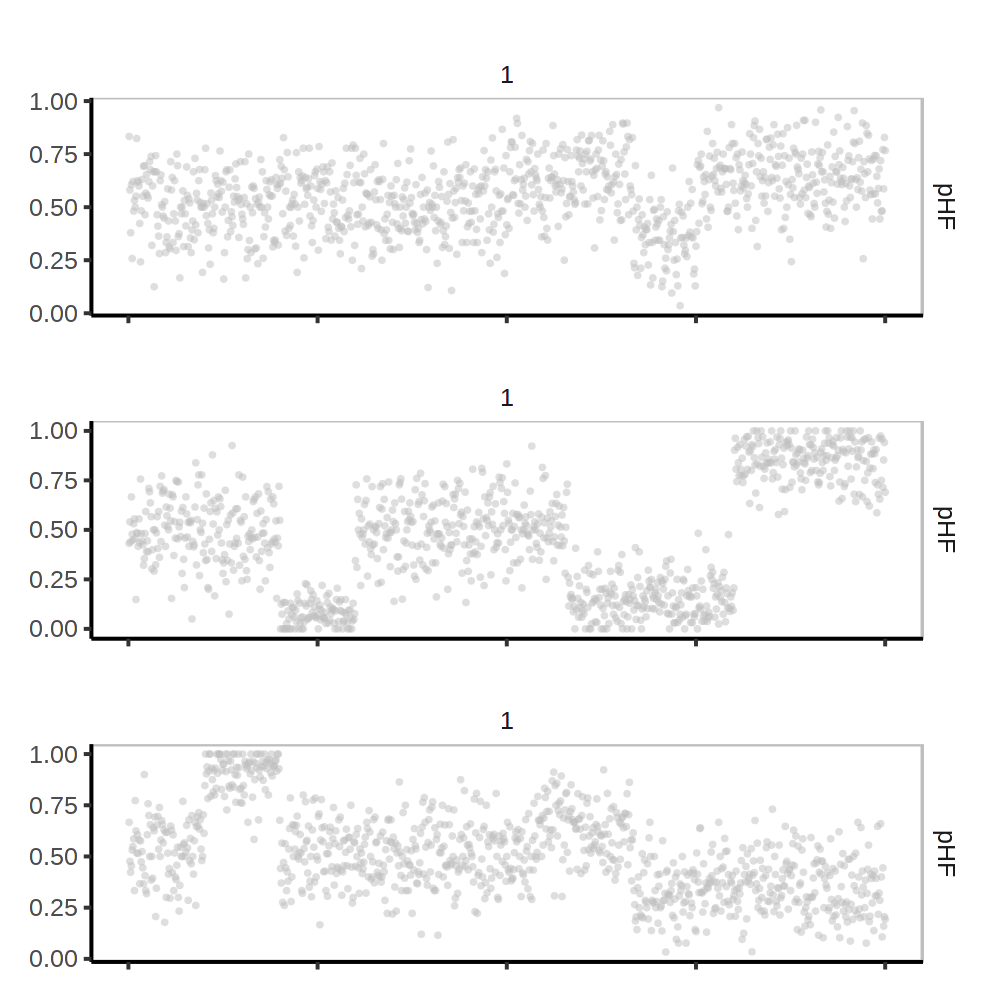

In [342]:
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 200)

bulks_sim %>% 
mutate(state = 'neu', cnv_state = 'neu', LLR = 0, logFC = 0) %>%
plot_bulks(phi_mle = FALSE, allele_only = TRUE)

In [348]:
R.utils::sourceDirectory('~/numbat/R')

res = run_treehmm(
    bulks_sim, 
    pa_dict = list(NULL,1,1),
    ch_dict = list(c(2,3), NULL, NULL),
    theta_min = 0.15,
    max_iter = 10,
    gamma = 5
)

iter 1

iter 2

iter 3

iter 4

iter 5

iter 6

iter 7

iter 8

iter 9

iter 10



In [356]:
D = lapply(
    1:10,
    function(k) {
        
        bulks_sim %>% 
        group_by(sample) %>%
        mutate(
            state = states[res$S[k, unique(sample),]],
            p_neu = res$P[k, unique(sample),]
        ) %>%
        mutate(k = k)
        
    }
) %>% 
bind_rows()

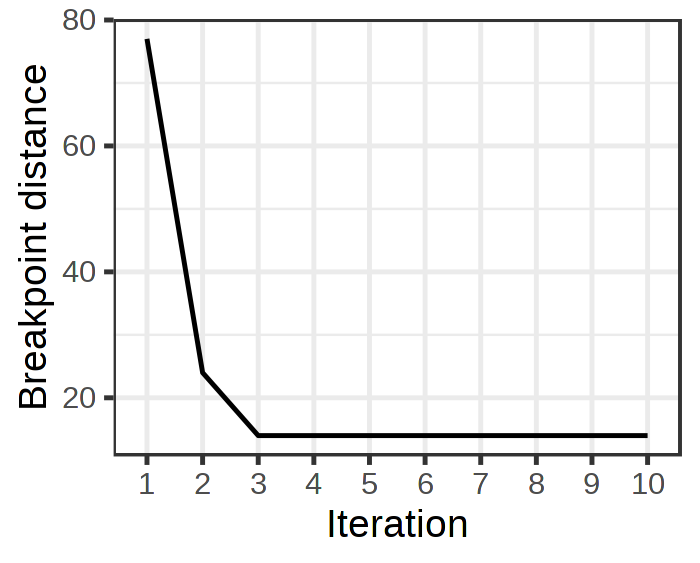

In [379]:
options(repr.plot.width = 2.8, repr.plot.height = 2.25, repr.plot.res = 250)

D %>% 
filter(snp_index > 400 & state == 'neu') %>% 
arrange(-snp_index) %>% 
distinct(sample, k, .keep_all = TRUE) %>%
arrange(k) %>%
group_by(k) %>%
summarise(
    distance = max(snp_index) - min(snp_index)
) %>%
ggplot(
    aes(x = factor(k), y = distance, group = 1)
) + 
theme_bw() +
geom_line() +
ylab('Breakpoint distance') +
xlab('Iteration')

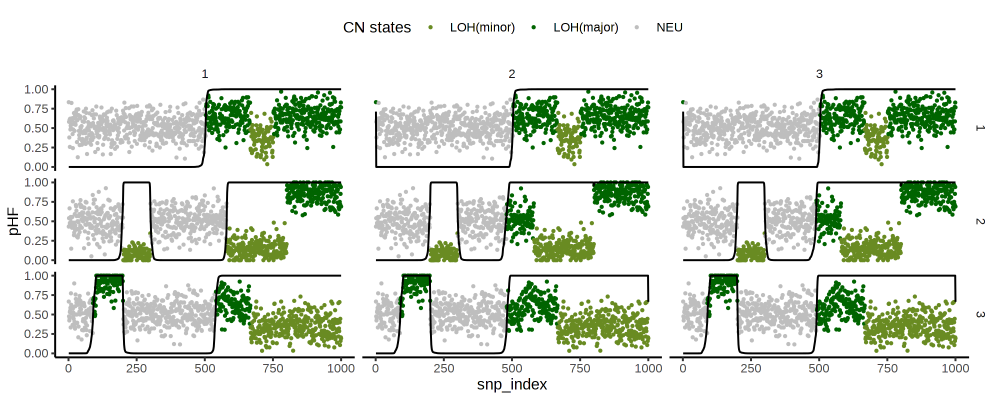

In [349]:
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 200)

states = c('neu', 'loh_up', 'loh_down')

lapply(
    1:3,
    function(k) {
        
        bulks_sim %>% 
        group_by(sample) %>%
        mutate(
            state = states[res$S[k, unique(sample),]],
            p_neu = res$P[k, unique(sample),]
        ) %>%
        mutate(k = k)
        
    }
) %>% 
bind_rows() %>%
filter(DP > 8) %>%
ggplot(
) +
geom_point(aes(x = snp_index, y = pBAF, color = state), size = 0.5) +
geom_line(
    inherit.aes = F,
    aes(x = snp_index, y = 1-p_neu)
) +
theme_classic() +
theme(
    strip.background = element_blank(),
    legend.position = 'top'
) +
facet_grid(sample~k) +
ylim(-0.001,1) +
ylab('pHF') +
scale_color_manual(
    values = cnv_colors,
    labels = cnv_labels,
    name = 'CN states',
    limits = force
)

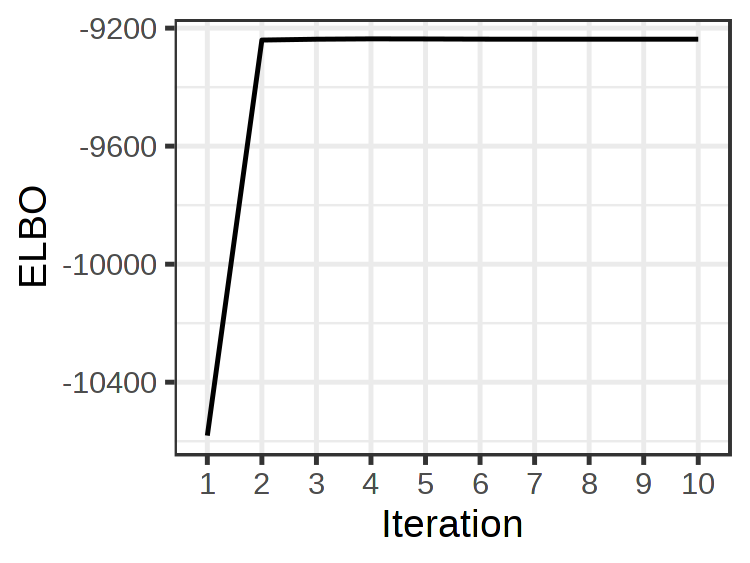

In [378]:
options(repr.plot.width = 3, repr.plot.height = 2.25, repr.plot.res = 250)

data.frame(
    F = res$F
) %>%
mutate(iter = 1:n()) %>%
ggplot() +
geom_line(
    aes(x = factor(iter), y = -F, group = 1)
) +
ylab('ELBO') +
xlab('Iteration') +
theme_bw()

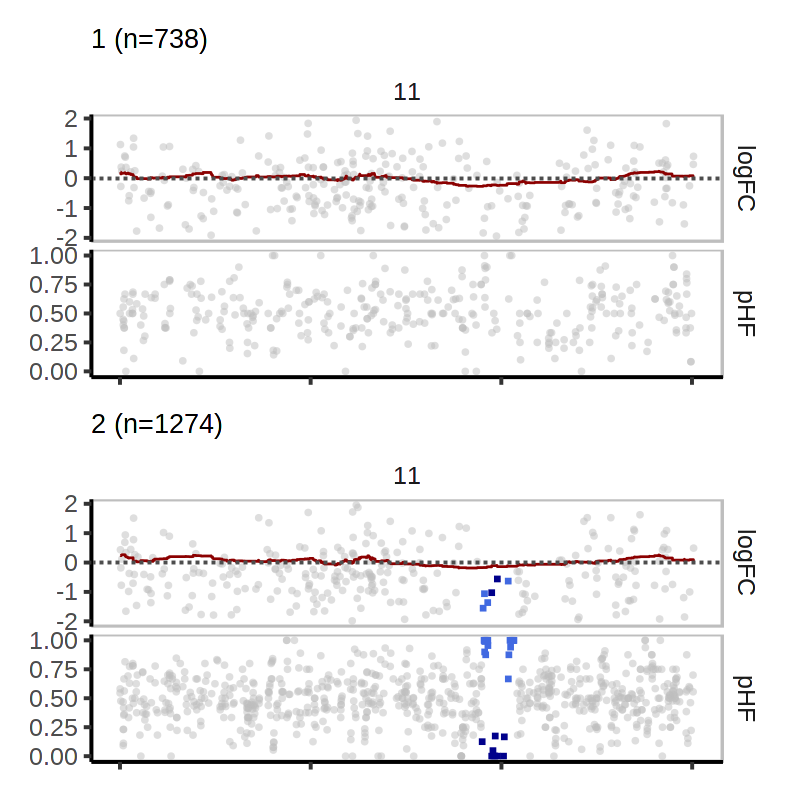

In [88]:
options(repr.plot.width = 4, repr.plot.height = 4, repr.plot.res = 200)

bulks %>% 
plot_bulks(phi_mle = FALSE)

In [233]:
R.utils::sourceDirectory('~/numbat/R')

res = run_treehmm(
    bulks_unified, 
    pa_dict = list(NULL,1),
    ch_dict = list(c(2), NULL),
    theta_min = 0.15,
    max_iter = 10,
    gamma = 5
)

iter 1

iter 2

iter 3

iter 4

iter 5

iter 6

iter 7

iter 8

iter 9

iter 10



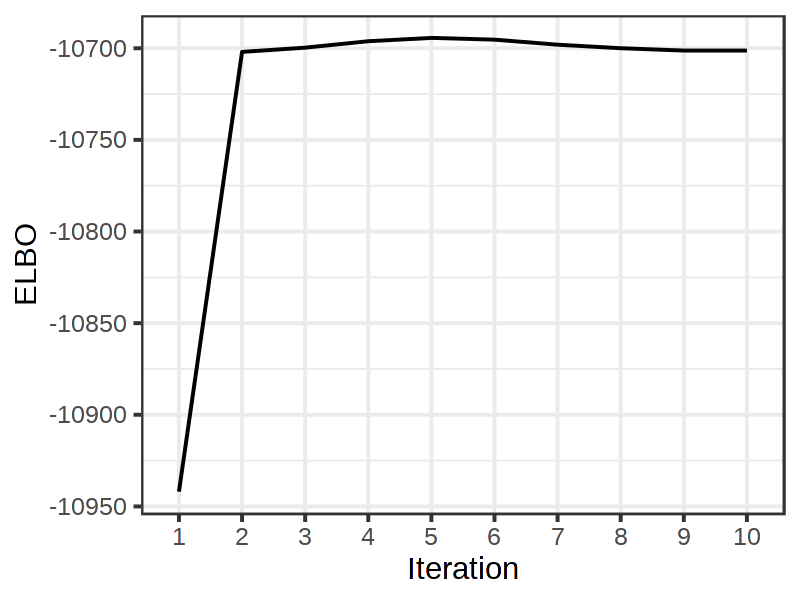

In [239]:
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 200)

data.frame(
    F = res$F
) %>%
mutate(iter = as.factor(1:n())) %>%
ggplot() +
geom_line(
    aes(x = iter, y = -F, group = '')
) +
ylab('ELBO') +
xlab('Iteration') +
theme_bw()

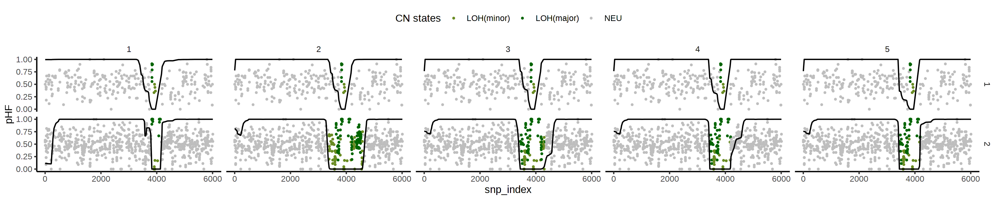

In [232]:
options(repr.plot.width = 15, repr.plot.height = 3, repr.plot.res = 200)

states = c('neu', 'loh_up', 'loh_down')

lapply(
    1:5,
    function(k) {
        
        bulks_unified %>% 
        group_by(sample) %>%
        mutate(
            state = states[res$S[k, unique(sample),]],
            p_neu = res$P[k, unique(sample),]
        ) %>%
        mutate(k = k)
        
    }
) %>% 
bind_rows() %>%
filter(DP > 8) %>%
ggplot(
) +
geom_point(aes(x = snp_index, y = pBAF, color = state), size = 0.5) +
geom_line(
    inherit.aes = F,
    aes(x = snp_index, y = p_neu)
) +
theme_classic() +
theme(
    strip.background = element_blank(),
    legend.position = 'top'
) +
facet_grid(sample~k) +
ylim(0,1) +
ylab('pHF') +
scale_color_manual(
    values = cnv_colors,
    labels = cnv_labels,
    name = 'CN states',
    limits = force
)

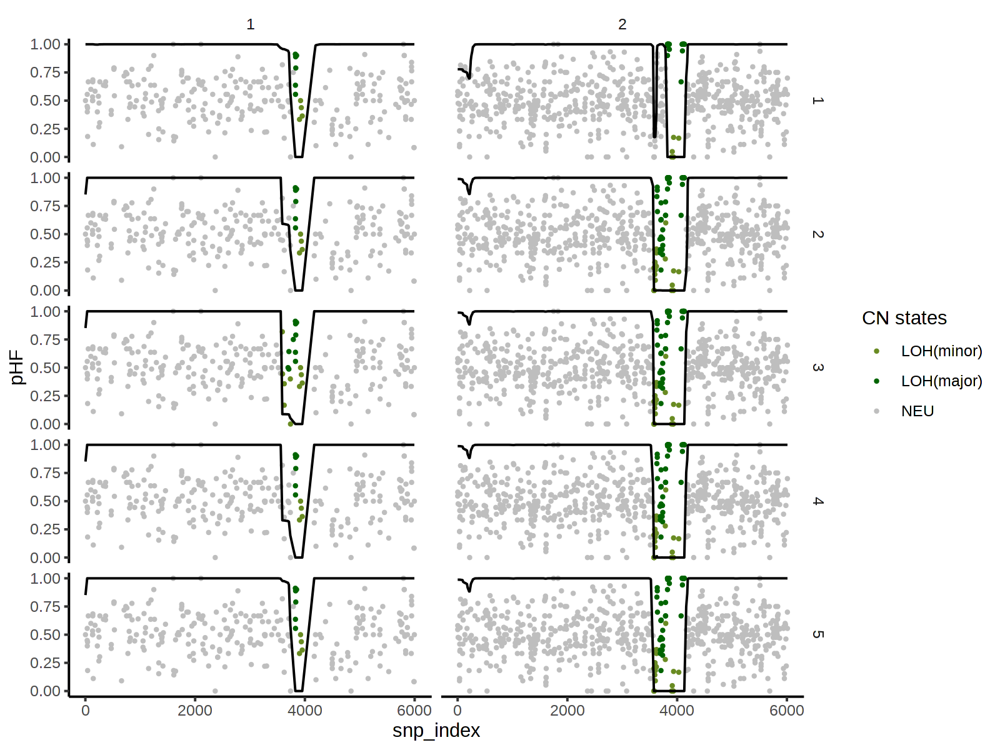

In [1597]:
options(repr.plot.width = 8, repr.plot.height = 6, repr.plot.res = 200)

states = c('neu', 'loh_up', 'loh_down')

lapply(
    1:5,
    function(k) {
        
        bulks_unified %>% 
        group_by(sample) %>%
        mutate(
            state = states[res$S[k, unique(sample),]],
            p_neu = res$P[k, unique(sample),]
        ) %>%
        mutate(k = k)
        
    }
) %>% 
bind_rows() %>%
filter(DP > 8) %>%
ggplot(
) +
geom_point(aes(x = snp_index, y = pBAF, color = state), size = 0.5) +
geom_line(
    inherit.aes = F,
    aes(x = snp_index, y = p_neu)
) +
theme_classic() +
theme(strip.background = element_blank()) +
facet_grid(k~sample) +
ylim(0,1) +
ylab('pHF') +
scale_color_manual(
    values = cnv_colors,
    labels = cnv_labels,
    name = 'CN states',
    limits = force
)

In [774]:
bulks = bulk_clones %>%
    filter(sample %in% c(2,3,4)) %>%
    arrange(sample) %>%
    mutate(sample = as.integer(factor(sample, unique(sample)))) %>%
    filter(CHROM == 10) %>%
    filter(!is.na(pAD)) %>%
    select(-phi_mle) %>%
    arrange(CHROM, POS) %>%
    mutate(snp_index = as.integer(factor(snp_id, unique(snp_id)))) %>%
    group_by(CHROM) %>%
    ungroup()

bulks_unified = bulks %>% 
    select(sample, CHROM, POS, snp_id, snp_index, cM, pAD, DP, p_s) %>%
    tidyr::pivot_wider(names_from = "sample", "values_from" = c("pAD", "DP")) %>%
    mutate(
        inter_snp_cm = c(NA, cM[2:length(cM)] - cM[1:(length(cM)-1)]),
        p_s = switch_prob_cm(inter_snp_cm)
    ) %>%
    as.data.table() %>%
    melt(
        measure.vars = list(
            str_subset(colnames(.), 'pAD'),
            str_subset(colnames(.), 'DP')),
        value.name = c('pAD', 'DP'),
        variable.name = 'sample'
    ) %>%
    mutate(pBAF = pAD/DP)

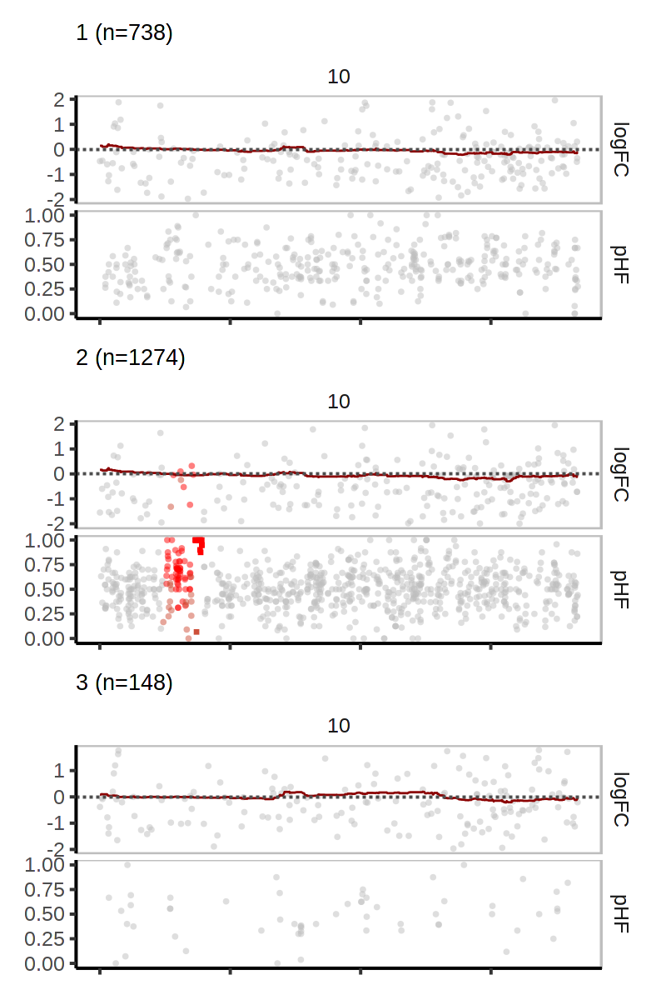

In [749]:
options(repr.plot.width = 4, repr.plot.height = 6, repr.plot.res = 200)

bulks %>% 
plot_bulks(phi_mle = F)

In [775]:
R.utils::sourceDirectory('~/numbat/R')

res = run_treehmm(
    bulks_unified, 
    pa_dict = list(NULL,1,1),
    ch_dict = list(c(2,3), NULL, NULL),
    theta_min = 0.1,
    max_iter = 8
)

iter 1

iter 2

iter 3

iter 4

iter 5

iter 6

iter 7

iter 8



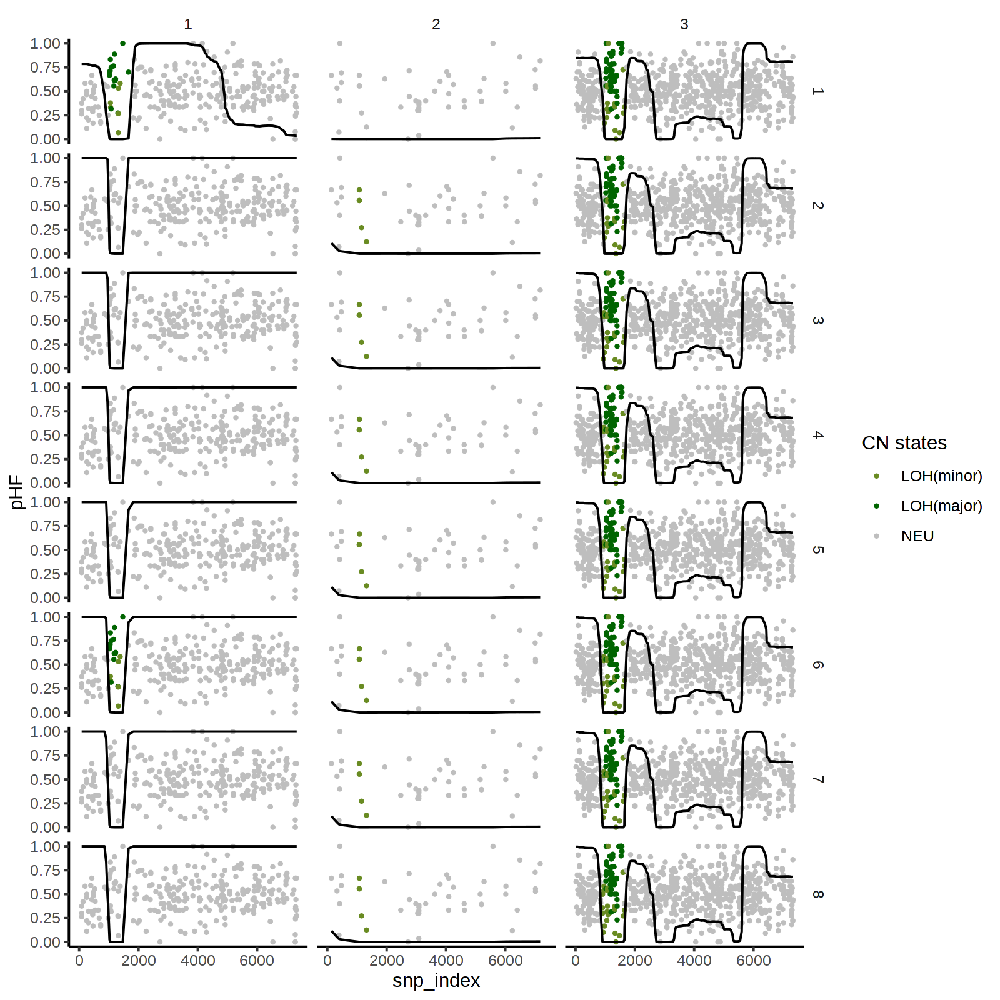

In [777]:
options(repr.plot.width = 8, repr.plot.height = 8, repr.plot.res = 200)

states = c('neu', 'loh_up', 'loh_down')

lapply(
    1:8,
    function(k) {
        
        bulks_unified %>% 
        group_by(sample) %>%
        mutate(
            state = states[res$S[k, unique(sample),]],
            p_neu = res$P[k, unique(sample),]
        ) %>%
        mutate(k = k)
        
    }
) %>% 
bind_rows() %>%
filter(DP > 8) %>%
ggplot(
) +
geom_point(aes(x = snp_index, y = pBAF, color = state), size = 0.5) +
geom_line(
    inherit.aes = F,
    aes(x = snp_index, y = p_neu)
) +
theme_classic() +
theme(strip.background = element_blank()) +
facet_grid(k~sample) +
ylim(0,1) +
ylab('pHF') +
scale_color_manual(
    values = cnv_colors,
    labels = cnv_labels,
    name = 'CN states',
    limits = force
)

In [805]:
bulks = bulk_clones %>%
    filter(sample %in% c(2,3)) %>%
    arrange(sample) %>%
    mutate(sample = as.integer(factor(sample, rev(unique(sample))))) %>%
    filter(CHROM == 12) %>%
    filter(!is.na(pAD)) %>%
    select(-phi_mle) %>%
    arrange(CHROM, POS) %>%
    mutate(snp_index = as.integer(factor(snp_id, unique(snp_id)))) %>%
    group_by(CHROM) %>%
    ungroup()

bulks_unified = bulks %>% 
    select(sample, CHROM, POS, snp_id, snp_index, cM, pAD, DP, p_s) %>%
    tidyr::pivot_wider(names_from = "sample", "values_from" = c("pAD", "DP")) %>%
    mutate(
        inter_snp_cm = c(NA, cM[2:length(cM)] - cM[1:(length(cM)-1)]),
        p_s = switch_prob_cm(inter_snp_cm)
    ) %>%
    as.data.table() %>%
    melt(
        measure.vars = list(
            str_subset(colnames(.), 'pAD'),
            str_subset(colnames(.), 'DP')),
        value.name = c('pAD', 'DP'),
        variable.name = 'sample'
    ) %>%
    mutate(pBAF = pAD/DP)

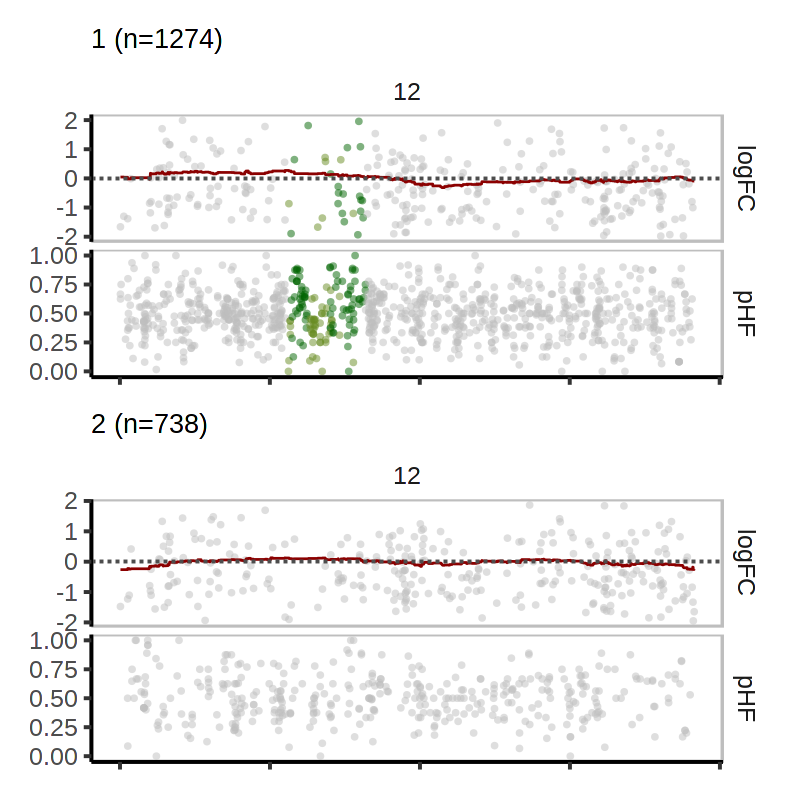

In [806]:
options(repr.plot.width = 4, repr.plot.height = 4, repr.plot.res = 200)

bulks %>% 
plot_bulks(phi_mle = F)

In [814]:
R.utils::sourceDirectory('~/numbat/R')

res = run_treehmm(
    bulks_unified, 
    pa_dict = list(NULL,1),
    ch_dict = list(c(2), NULL),
    theta_min = 0.15,
    max_iter = 8
)

iter 1

iter 2

iter 3

iter 4

iter 5

iter 6

iter 7

iter 8



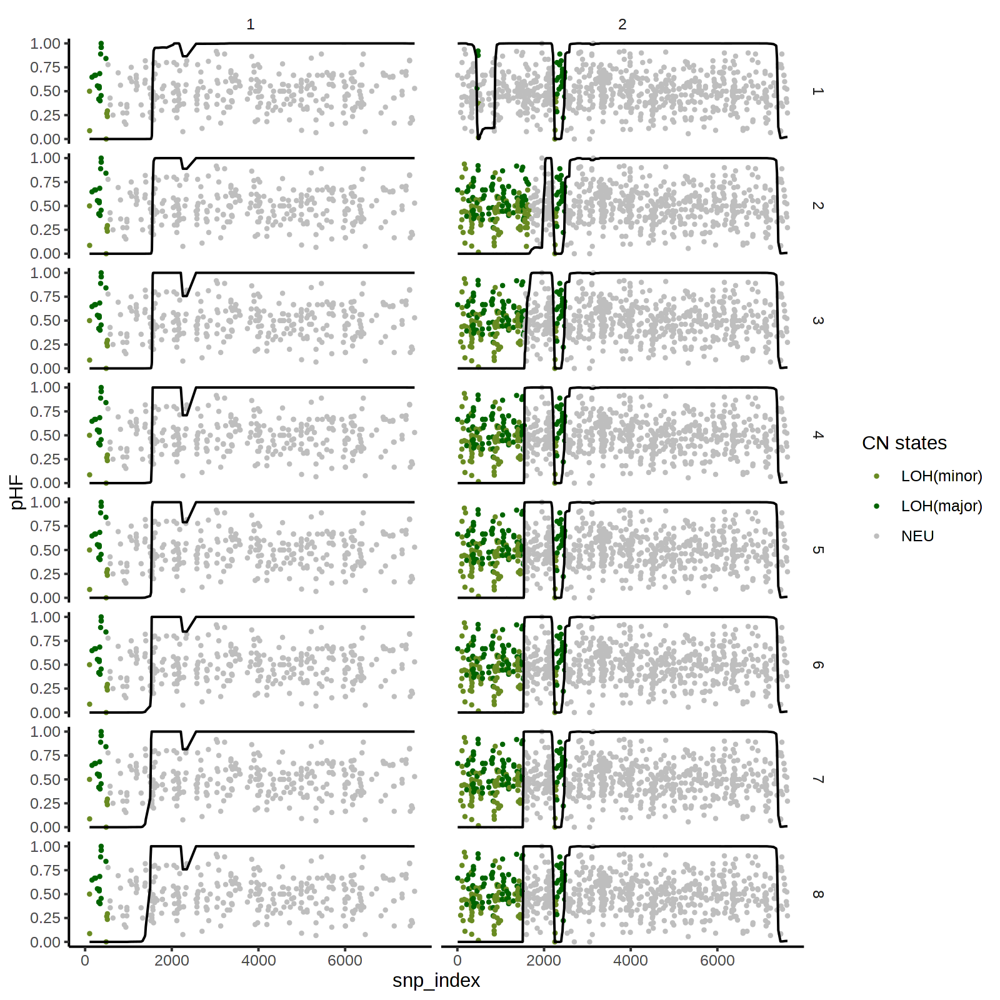

In [815]:
options(repr.plot.width = 8, repr.plot.height = 8, repr.plot.res = 200)

states = c('neu', 'loh_up', 'loh_down')

lapply(
    1:8,
    function(k) {
        
        bulks_unified %>% 
        group_by(sample) %>%
        mutate(
            state = states[res$S[k, unique(sample),]],
            p_neu = res$P[k, unique(sample),]
        ) %>%
        mutate(k = k)
        
    }
) %>% 
bind_rows() %>%
filter(DP > 8) %>%
ggplot(
) +
geom_point(aes(x = snp_index, y = pBAF, color = state), size = 0.5) +
geom_line(
    inherit.aes = F,
    aes(x = snp_index, y = p_neu)
) +
theme_classic() +
theme(strip.background = element_blank()) +
facet_grid(k~sample) +
ylim(0,NA) +
ylab('pHF') +
scale_color_manual(
    values = cnv_colors,
    labels = cnv_labels,
    name = 'CN states',
    limits = force
)

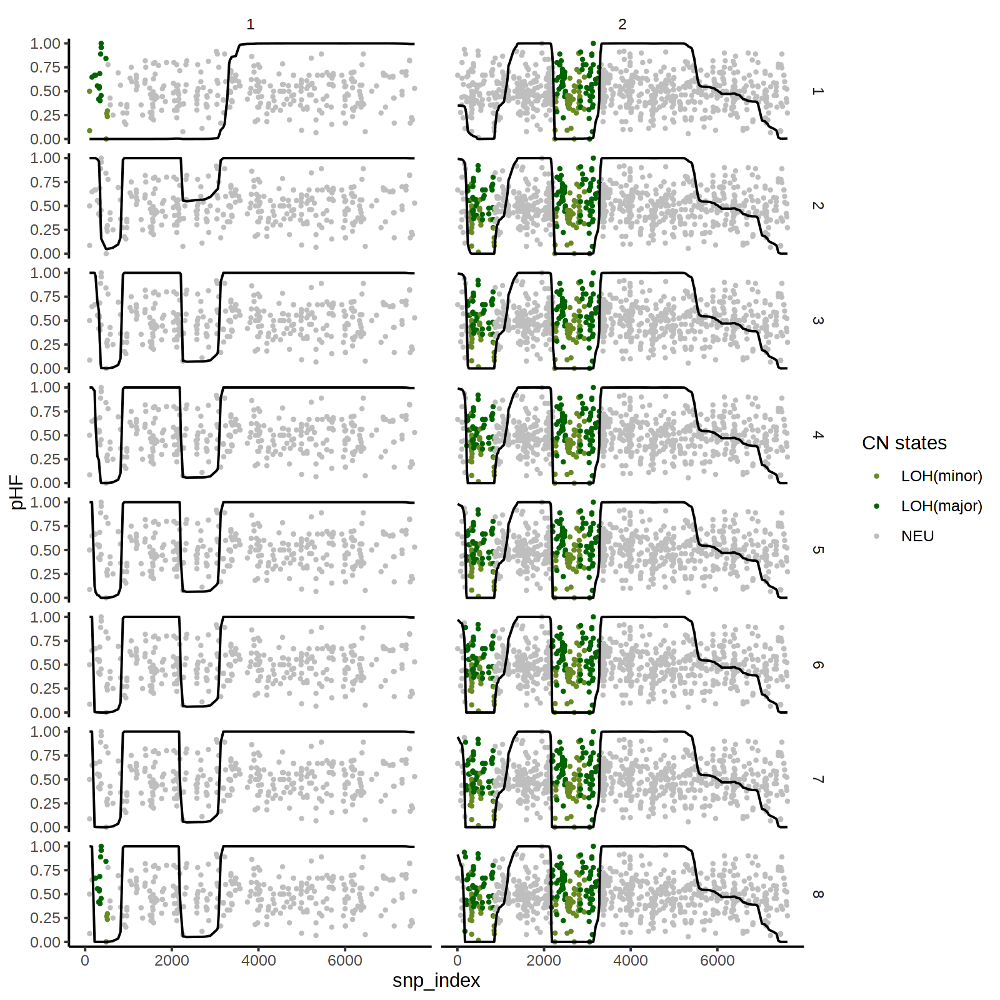

In [808]:
options(repr.plot.width = 8, repr.plot.height = 8, repr.plot.res = 200)

states = c('neu', 'loh_up', 'loh_down')

lapply(
    1:8,
    function(k) {
        
        bulks_unified %>% 
        group_by(sample) %>%
        mutate(
            state = states[res$S[k, unique(sample),]],
            p_neu = res$P[k, unique(sample),]
        ) %>%
        mutate(k = k)
        
    }
) %>% 
bind_rows() %>%
filter(DP > 8) %>%
ggplot(
) +
geom_point(aes(x = snp_index, y = pBAF, color = state), size = 0.5) +
geom_line(
    inherit.aes = F,
    aes(x = snp_index, y = p_neu)
) +
theme_classic() +
theme(strip.background = element_blank()) +
facet_grid(k~sample) +
ylim(0,NA) +
ylab('pHF') +
scale_color_manual(
    values = cnv_colors,
    labels = cnv_labels,
    name = 'CN states',
    limits = force
)

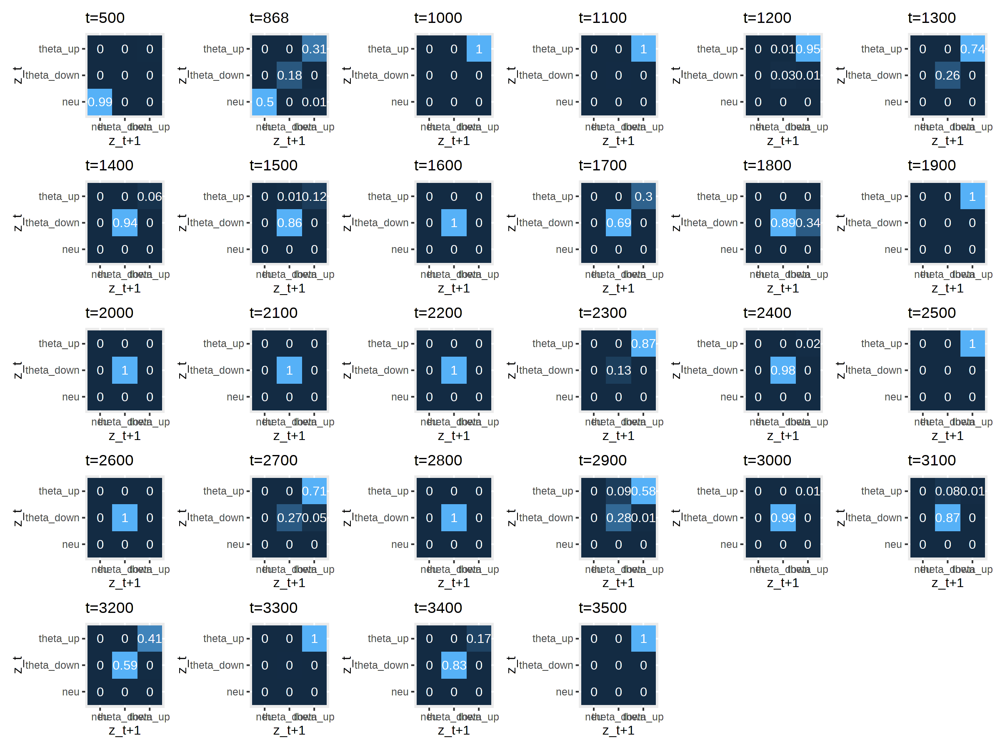

In [240]:
options(repr.plot.width = 12, repr.plot.height = 9, repr.plot.res = 200)

lapply(
    c(500, 868, seq(1000, 3500, 100)),
    function(t) {
        fb$edge_marginals[[t]] %>%
        as.data.frame() %>%
        tibble::rownames_to_column('state') %>%
        tidyr::pivot_longer(cols = c("neu", "theta_up", "theta_down")) %>%
        setNames(c('z_t', 'z_t+1', 'p')) %>%
        ggplot(
            aes(y = z_t, x = `z_t+1`, fill = p, label = round(p, 2))
        ) +
        geom_tile() +
        geom_text(color = 'white') +
        ggtitle(glue('t={t}')) +
        guides(fill = 'none')
        
    }
) %>%
wrap_plots()

In [1598]:
bulk_chr = bulk %>% 
    filter(CHROM == 5) %>% 
    filter(!is.na(pAD)) %>%
    mutate(snp_index = 1:n()) %>%
    mutate(p_s = 0.05)

hmm = bulk_chr %>% {get_single_allele_hmm(.$pAD, .$DP, .$p_s, theta_min = 0.2)}

fb = forward_back_allele_R(hmm)

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

Warning message:
“Removed 2 rows containing missing values (geom_bar).”


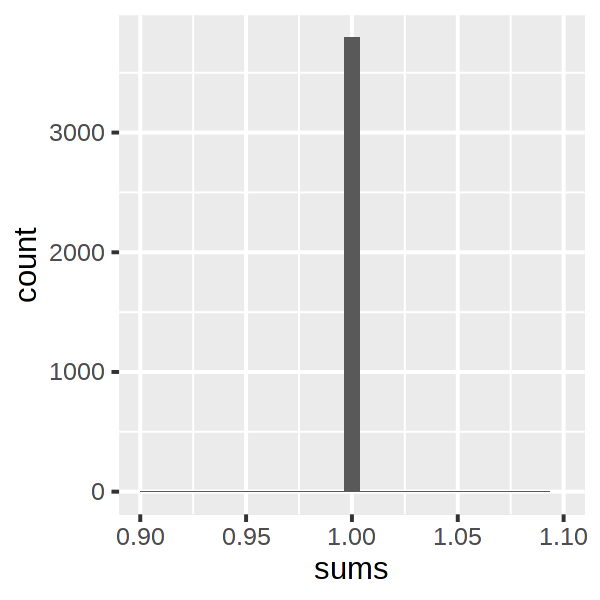

In [1606]:
options(repr.plot.width = 3, repr.plot.height = 3, repr.plot.res = 200)

data.frame(
    sums = rowSums(fb$marginals)
)  %>%
ggplot(
    aes(x = sums)
) +
geom_histogram() +
xlim(0.9, 1.1)

In [1601]:
 %>%  

NULL

In [1395]:
edge_sums = sapply(2:dim(fb$edge_marginals)[1], function(t) {sum(fb$edge_marginals[t,,])})

In [1396]:
ts = which(edge_sums > 2)

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

Warning message:
“Removed 6 rows containing non-finite values (stat_bin).”
Warning message:
“Removed 1 rows containing missing values (geom_bar).”


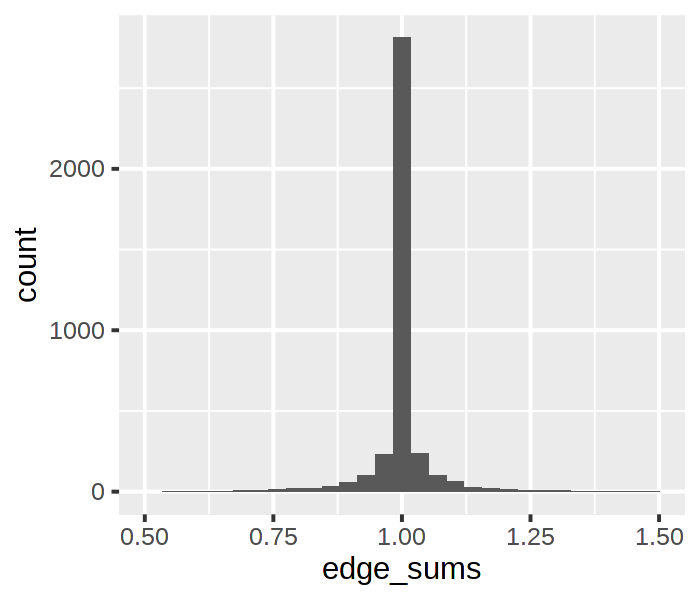

In [1404]:
data.frame(
    edge_sums
)  %>%
ggplot(
    aes(x = edge_sums)
) +
geom_histogram() +
xlim(0.5, 1.5)

In [1418]:
Q_pair = fb$edge_marginals
Q = fb$marginals

In [1420]:
Q_pair %>% dim

[1] 3791    3    3

In [1422]:
Q_pair[t,,]/Q[t,]

,neu,theta_up,theta_down
neu,9.999812e-01,1.285993e-09,5.246887e-09
theta_up,2.993428e-06,7.314094e-05,1.570616e-05
theta_down,1.282898e-05,1.649796e-05,1.278930e-03


In [1419]:
t = 2
Q_pair[t,,]

,neu,theta_up,theta_down
neu,9.985988e-01,1.284215e-09,5.239634e-09
theta_up,2.989290e-06,7.303983e-05,1.568445e-05
theta_down,1.281124e-05,1.647515e-05,1.277162e-03


In [1373]:
fb$logPi[[t+1]] %>% exp

0.99999,0.0000050,0.0000050
0.00001,0.9499905,0.0499995
0.00001,0.0499995,0.9499905


In [1364]:
purrr::map(fb$logPi, function(x) {all(rowSums(exp(x)) == 1)})

[[1]]
[1] TRUE

[[2]]
[1] TRUE

[[3]]
[1] TRUE

[[4]]
[1] TRUE

[[5]]
[1] TRUE

[[6]]
[1] TRUE

[[7]]
[1] TRUE

[[8]]
[1] FALSE

[[9]]
[1] TRUE

[[10]]
[1] TRUE

[[11]]
[1] TRUE

[[12]]
[1] FALSE

[[13]]
[1] TRUE

[[14]]
[1] TRUE

[[15]]
[1] TRUE

[[16]]
[1] TRUE

[[17]]
[1] TRUE

[[18]]
[1] TRUE

[[19]]
[1] TRUE

[[20]]
[1] TRUE

[[21]]
[1] TRUE

[[22]]
[1] TRUE

[[23]]
[1] FALSE

[[24]]
[1] TRUE

[[25]]
[1] TRUE

[[26]]
[1] TRUE

[[27]]
[1] TRUE

[[28]]
[1] TRUE

[[29]]
[1] TRUE

[[30]]
[1] TRUE

[[31]]
[1] TRUE

[[32]]
[1] TRUE

[[33]]
[1] TRUE

[[34]]
[1] TRUE

[[35]]
[1] TRUE

[[36]]
[1] TRUE

[[37]]
[1] TRUE

[[38]]
[1] TRUE

[[39]]
[1] TRUE

[[40]]
[1] TRUE

[[41]]
[1] TRUE

[[42]]
[1] TRUE

[[43]]
[1] TRUE

[[44]]
[1] TRUE

[[45]]
[1] TRUE

[[46]]
[1] TRUE

[[47]]
[1] TRUE

[[48]]
[1] TRUE

[[49]]
[1] FALSE

[[50]]
[1] TRUE

[[51]]
[1] FALSE

[[52]]
[1] TRUE

[[53]]
[1] TRUE

[[54]]
[1] TRUE

[[55]]
[1] FALSE

[[56]]
[1] TRUE

[[57]]
[1] FALSE

[[58]]
[1] TRUE

[[59]]
[1] TRUE

[[60]]
[1] FALSE

[[61]]
[1] TRUE

[[62]]
[1] FALSE

[[63]]
[1] TRUE

[[64]]
[1] TRUE

[[65]]
[1] TRUE

[[66]]
[1] TRUE

[[67]]
[1] TRUE

[[68]]
[1] TRUE

[[69]]
[1] TRUE

[[70]]
[1] TRUE

[[71]]
[1] TRUE

[[72]]
[1] TRUE

[[73]]
[1] TRUE

[[74]]
[1] TRUE

[[75]]
[1] TRUE

[[76]]
[1] TRUE

[[77]]
[1] TRUE

[[78]]
[1] TRUE

[[79]]
[1] TRUE

[[80]]
[1] TRUE

[[81]]
[1] TRUE

[[82]]
[1] TRUE

[[83]]
[1] TRUE

[[84]]
[1] TRUE

[[85]]
[1] TRUE

[[86]]
[1] TRUE

[[87]]
[1] TRUE

[[88]]
[1] TRUE

[[89]]
[1] TRUE

[[90]]
[1] TRUE

[[91]]
[1] TRUE

[[92]]
[1] TRUE

[[93]]
[1] TRUE

[[94]]
[1] TRUE

[[95]]
[1] TRUE

[[96]]
[1] TRUE

[[97]]
[1] TRUE

[[98]]
[1] TRUE

[[99]]
[1] FALSE

[[100]]
[1] TRUE

[[101]]
[1] TRUE

[[102]]
[1] TRUE

[[103]]
[1] TRUE

[[104]]
[1] TRUE

[[105]]
[1] TRUE

[[106]]
[1] TRUE

[[107]]
[1] TRUE

[[108]]
[1] TRUE

[[109]]
[1] TRUE

[[110]]
[1] TRUE

[[111]]
[1] FALSE

[[112]]
[1] TRUE

[[113]]
[1] TRUE

[[114]]
[1] TRUE

[[115]]
[1] TRUE

[[116]]
[1] TRUE

[[117]]
[1] TRUE

[[118]]
[1] TRUE

[[119]]
[1] FALSE

[[120]]
[1] TRUE

[[121]]
[1] TRUE

[[122]]
[1] TRUE

[[123]]
[1] TRUE

[[124]]
[1] TRUE

[[125]]
[1] TRUE

[[126]]
[1] TRUE

[[127]]
[1] TRUE

[[128]]
[1] TRUE

[[129]]
[1] TRUE

[[130]]
[1] TRUE

[[131]]
[1] TRUE

[[132]]
[1] TRUE

[[133]]
[1] TRUE

[[134]]
[1] TRUE

[[135]]
[1] TRUE

[[136]]
[1] TRUE

[[137]]
[1] TRUE

[[138]]
[1] TRUE

[[139]]
[1] TRUE

[[140]]
[1] TRUE

[[141]]
[1] TRUE

[[142]]
[1] TRUE

[[143]]
[1] TRUE

[[144]]
[1] TRUE

[[145]]
[1] TRUE

[[146]]
[1] TRUE

[[147]]
[1] TRUE

[[148]]
[1] TRUE

[[149]]
[1] TRUE

[[150]]
[1] TRUE

[[151]]
[1] FALSE

[[152]]
[1] TRUE

[[153]]
[1] TRUE

[[154]]
[1] TRUE

[[155]]
[1] TRUE

[[156]]
[1] TRUE

[[157]]
[1] TRUE

[[158]]
[1] TRUE

[[159]]
[1] TRUE

[[160]]
[1] TRUE

[[161]]
[1] TRUE

[[162]]
[1] TRUE

[[163]]
[1] TRUE

[[164]]
[1] TRUE

[[165]]
[1] TRUE

[[166]]
[1] TRUE

[[167]]
[1] TRUE

[[168]]
[1] TRUE

[[169]]
[1] TRUE

[[170]]
[1] TRUE

[[171]]
[1] TRUE

[[172]]
[1] TRUE

[[173]]
[1] TRUE

[[174]]
[1] TRUE

[[175]]
[1] TRUE

[[176]]
[1] TRUE

[[177]]
[1] TRUE

[[178]]
[1] TRUE

[[179]]
[1] FALSE

[[180]]
[1] TRUE

[[181]]
[1] TRUE

[[182]]
[1] TRUE

[[183]]
[1] TRUE

[[184]]
[1] TRUE

[[185]]
[1] TRUE

[[186]]
[1] TRUE

[[187]]
[1] TRUE

[[188]]
[1] FALSE

[[189]]
[1] TRUE

[[190]]
[1] TRUE

[[191]]
[1] TRUE

[[192]]
[1] TRUE

[[193]]
[1] TRUE

[[194]]
[1] TRUE

[[195]]
[1] TRUE

[[196]]
[1] TRUE

[[197]]
[1] TRUE

[[198]]
[1] TRUE

[[199]]
[1] FALSE

[[200]]
[1] TRUE

[[201]]
[1] TRUE

[[202]]
[1] TRUE

[[203]]
[1] FALSE

[[204]]
[1] TRUE

[[205]]
[1] FALSE

[[206]]
[1] TRUE

[[207]]
[1] TRUE

[[208]]
[1] TRUE

[[209]]
[1] TRUE

[[210]]
[1] TRUE

[[211]]
[1] TRUE

[[212]]
[1] TRUE

[[213]]
[1] TRUE

[[214]]
[1] TRUE

[[215]]
[1] TRUE

[[216]]
[1] TRUE

[[217]]
[1] TRUE

[[218]]
[1] TRUE

[[219]]
[1] TRUE

[[220]]
[1] TRUE

[[221]]
[1] TRUE

[[222]]
[1] TRUE

[[223]]
[1] TRUE

[[224]]
[1] TRUE

[[225]]
[1] TRUE

[[226]]
[1] FALSE

[[227]]
[1] TRUE

[[2

In [1331]:
for (t in ts) {
    display(fb$edge_marginals[t+1,,])
}

,neu,theta_up,theta_down
neu,8.619834e-07,2.272895e-09,6.699993e-08
theta_up,4.505769e-09,1.296518e-01,3.182467e+00
theta_down,2.415807e-10,5.788450e-03,2.049116e-01


,neu,theta_up,theta_down
neu,1.619961e-09,2.836149e-13,3.222840e-10
theta_up,3.908786e-09,1.165740e-02,2.305588e+00
theta_down,6.889035e-14,3.575926e-08,2.334682e-04


,neu,theta_up,theta_down
neu,6.288020e-09,2.131116e-10,3.236357e-10
theta_up,2.495895e-09,8.905107e-01,1.216805e+00
theta_down,5.790777e-12,1.859012e-03,3.137611e-03


,neu,theta_up,theta_down
neu,3.519350e-05,9.708031e-08,6.845202e-09
theta_up,2.657145e-09,7.751172e-02,4.870781e-03
theta_down,6.902927e-08,1.794575e+00,1.419844e-01


,neu,theta_up,theta_down
neu,4.712786e-07,1.991475e-08,5.354377e-12
theta_up,1.144191e-11,7.011060e-03,7.148387e-07
theta_down,2.129121e-08,4.947386e+00,3.507677e-03


,neu,theta_up,theta_down
neu,8.520511e-10,1.320222e-12,2.199268e-10
theta_up,3.251077e-08,9.999699e-01,1.248524e+00
theta_down,6.281672e-16,1.448151e-10,3.218594e-06


,neu,theta_up,theta_down
neu,8.033628e-10,8.247722e-12,2.986777e-10
theta_up,1.317140e-09,1.551887e-01,4.173743e+00
theta_down,2.139068e-12,1.871757e-04,9.126858e-03


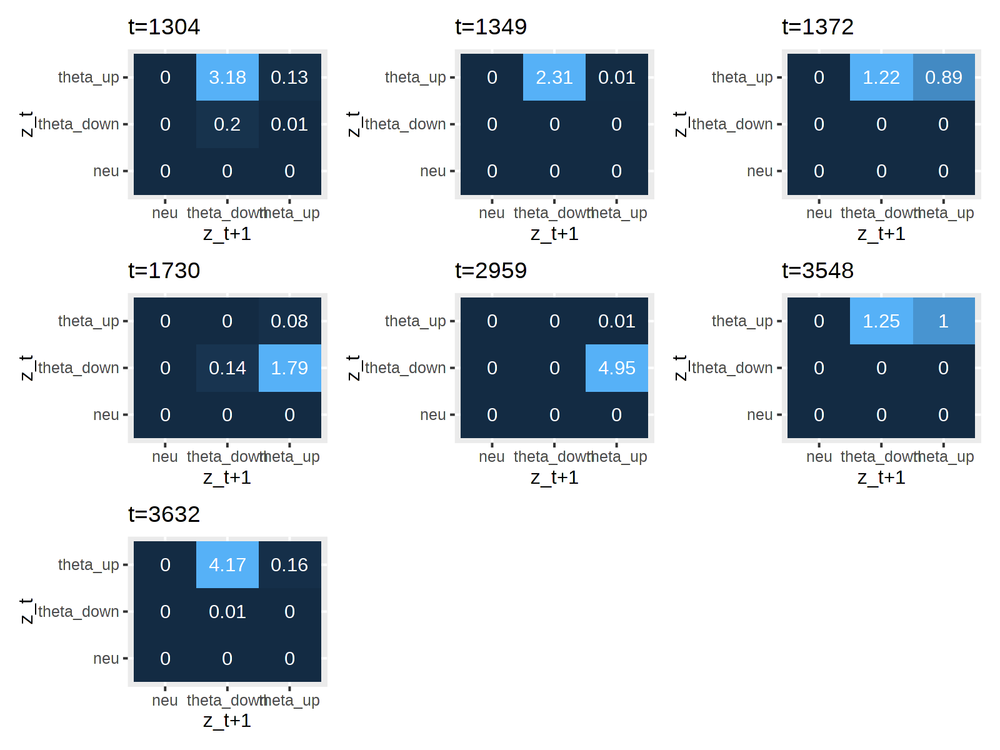

In [1336]:
options(repr.plot.width = 8, repr.plot.height = 6, repr.plot.res = 200)

lapply(
    ts,
    function(t) {
        fb$edge_marginals[t+1,,] %>%
        as.data.frame() %>%
        tibble::rownames_to_column('state') %>%
        tidyr::pivot_longer(cols = c("neu", "theta_up", "theta_down")) %>%
        setNames(c('z_t', 'z_t+1', 'p')) %>%
        ggplot(
            aes(y = z_t, x = `z_t+1`, fill = p, label = round(p, 2))
        ) +
        geom_tile() +
        geom_text(color = 'white') +
        ggtitle(glue('t={t}')) +
        guides(fill = 'none')
        
    }
) %>%
wrap_plots()

In [1339]:
for (t in ts) {
    display(exp(fb$logPi[[t+1]]))
}

0.99999,0.0000050,0.0000050
0.00001,0.5456364,0.4543536
0.00001,0.4543536,0.5456364


0.99999,0.000005,0.000005
0.00001,0.851745,0.148245
0.00001,0.148245,0.851745


0.99999,0.0000050,0.0000050
0.00001,0.5263737,0.4736163
0.00001,0.4736163,0.5263737


0.99999,0.000005,0.000005
0.00001,0.528759,0.471231
0.00001,0.471231,0.528759


0.99999,0.0000050,0.0000050
0.00001,0.7250407,0.2749493
0.00001,0.2749493,0.7250407


0.99999,0.000005000,0.000005000
0.00001,0.992550708,0.007439292
0.00001,0.007439292,0.992550708


0.99999,0.0000050,0.0000050
0.00001,0.5738258,0.4261642
0.00001,0.4261642,0.5738258


In [1350]:
for (t in ts) {
    display(bulk_chr$p_s[t+1])
}

[1] 0.4543581

[1] 0.1482465

[1] 0.4736211

[1] 0.4712358

[1] 0.2749521

[1] 0.007439366

[1] 0.4261684

In [1407]:
t = 2959

fb$edge_marginals[t+1,,] 

exp(outer(fb$logalpha[t,], fb$logbeta[t+1,], FUN = '+') + fb$logPi[[t+1]] + fb$logprob[t+1,] - fb$LL)

,neu,theta_up,theta_down
neu,1.866400e-07,6.253046e-09,5.780709e-10
theta_up,9.476272e-10,6.032109e-01,2.934980e-03
theta_down,5.829610e-09,1.953069e-01,3.430526e-01


1.866400e-07,6.253046e-09,5.780709e-10
9.476272e-10,6.032109e-01,2.934980e-03
5.829610e-09,1.953069e-01,3.430526e-01


In [1414]:
fb$edge_marginals[t+1,,] %>% sum

[1] 1.144506

In [1413]:
exp(logSumExp(c(outer(fb$logalpha[t,], fb$logbeta[t+1,], FUN = '+') + fb$logPi[[t+1]] + fb$logprob[t+1,] - fb$LL)))

[1] 1.144506

In [1297]:
bigT = nrow(bulk_chr)

In [1312]:
fb$LL
logSumExp(fb$logalpha[bigT,])
logSumExp(fb$logbeta[1,] + fb$logprob[1,] + log(hmm$delta))

[1] -3797.252

[1] -3797.252

[1] -3797.252

In [1322]:
sapply(
    1:bigT,
    function(t){
        logSumExp(fb$logalpha[t,] + fb$logbeta[t,])
    }
) %>% 
signif(10) %>% 
unique

[1] -3797.252

In [1295]:
2980.93346780922 + 812.735509843463

[1] 3793.669

In [1286]:
fb$logalpha[t,]

[1] -2988.703 -2986.853 -2980.933

In [1287]:
fb$logbeta[t+1,]

[1] -821.7776 -812.7355 -820.9568

In [1248]:
exp(fb$logalpha[t,] + fb$logbeta[t,] - fb$LL) 

[1] 4.788927e-07 7.014634e-03 9.929849e-01

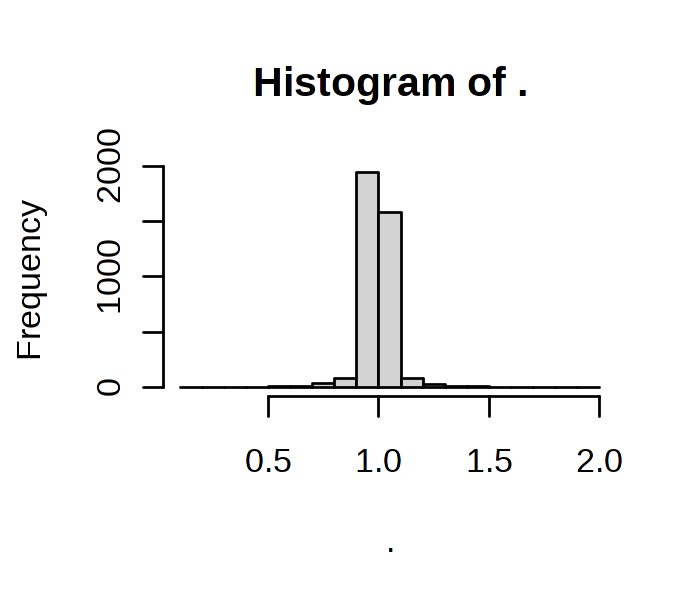

In [1372]:
options(repr.plot.width = 3.5, repr.plot.height = 3, repr.plot.res = 200)

edge_sums %>% hist

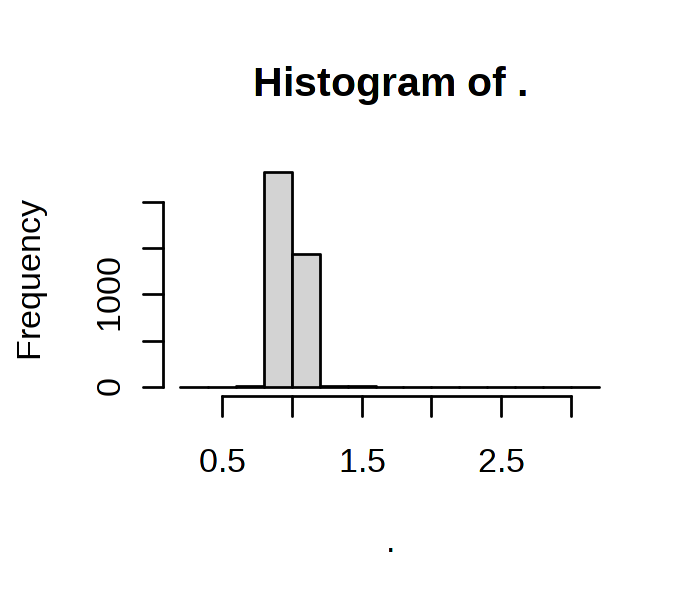

In [63]:
options(repr.plot.width = 3.5, repr.plot.height = 3, repr.plot.res = 200)

fb$edge_marginals %>% purrr::map(sum) %>% unlist %>% hist

In [1622]:
exp_post = fread('~/numbat_output_files/exp_post_1.tsv')
allele_post = fread('~/numbat_output_files/allele_post_1.tsv')
gtree = readRDS('~/numbat_output_files/tree_final_1.rds')
mut_graph = readRDS('~/numbat_output_files/mut_graph_1.rds')

In [1675]:
R.utils::sourceDirectory('~/numbat/R')

clone_post = get_clone_post(gtree, exp_post, allele_post)

In [ ]:
exp_post %>%
group_by(
    aes(x = )
)

In [2]:
R.utils::sourceDirectory('~/numbat/R')


In [3]:
df_allele = readRDS('~/numbat_issue29_input_files/df_allele.rds')
count_mat = readRDS('~/numbat_issue29_input_files/count_mat.rds')
lambdas_ref  = readRDS('~/def_ref_hca_v1.rds')

In [29]:
genetic_map = numbat::genetic_map_hg38
gtf = numbat::gtf_hg38
lambda = 1
min_depth = 0
verbose = TRUE

In [1691]:
bulk = get_bulk(
    count_mat = count_mat,
    df_allele = df_allele,
    lambdas_ref = lambdas_ref,
    gtf = gtf_hg38,
    genetic_map = genetic_map_hg38,
    min_depth = 0
)

number of genes left: 10299



ERROR: Error in vec_slice(x_out, x_slicer): long vectors not supported yet: ../../src/include/Rinlinedfuns.h:537


In [12]:
df_allele = df_allele %>% mutate(snp_id = paste0(CHROM, '_', POS, '_', REF, '_', ALT)) 

In [21]:
allele_bulk = get_allele_bulk(
    df_allele,
    genetic_map,
    lambda = lambda,
    min_depth = min_depth)

In [48]:
fit = fit_ref_sse(rowSums(count_mat), numbat::ref_hca, gtf)

In [46]:
fit$lambdas_bar %>% tail

CHKB      CHKB-DT     MAPK8IP2         ARSA       SHANK3       RABL2B 
8.046491e-01 4.143582e-02 1.145249e-04 2.378522e-01 5.733691e-05 2.330586e-01

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



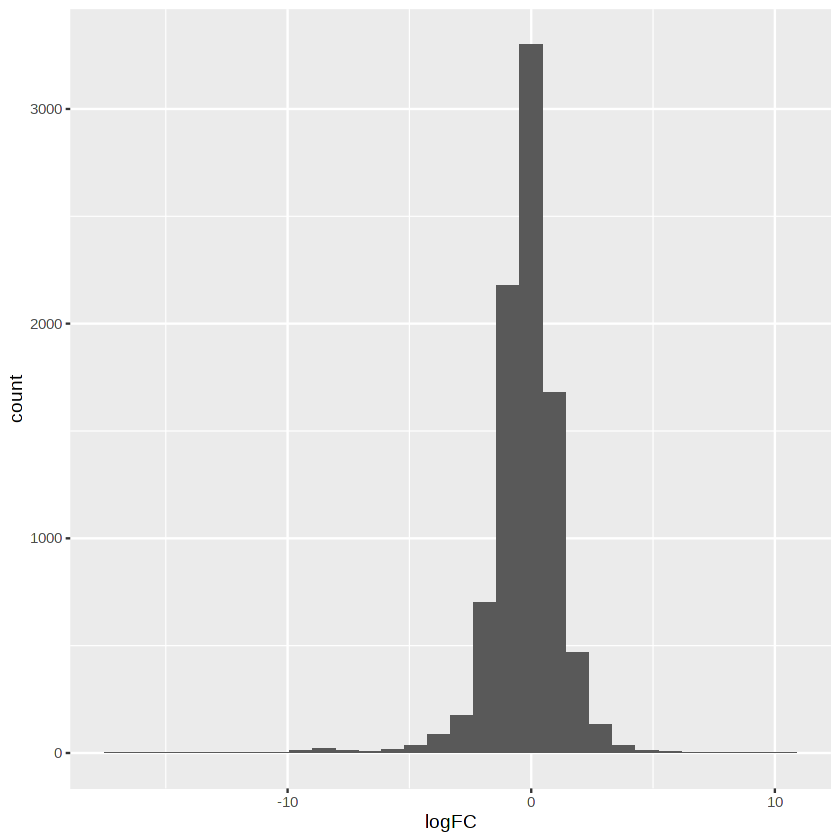

In [51]:
exp_bulk %>%
ggplot(
    aes(x = logFC)
) +
geom_histogram()

In [33]:
exp_bulk 

gene,Y_obs,lambda_obs,lambda_ref,d_obs,gene_start,gene_end,CHROM,region,gene_length,gene_index,logFC,lnFC
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<fct>,<chr>,<int>,<int>,<dbl>,<dbl>
LHX8,18375,1.262829e-04,3.653826e-03,145506662,75128434,75161533,1,chr1:75128434-75161533,33099,470,-4.8546771,-3.3650057
HAGLR,469,3.223220e-06,8.305644e-05,145506662,176173189,176188958,2,chr2:176173189-176188958,15769,1614,-4.6875174,-3.2491395
WNT5A,7203,4.950289e-05,1.502133e-03,145506662,55465715,55487642,3,chr3:55465715-55487642,21927,2100,-4.9233557,-3.4126101
ERC2,209,1.436360e-06,3.129216e-05,145506662,55508311,56468467,3,chr3:55508311-56468467,960156,2101,-4.4453116,-3.0812552
ST3GAL6-AS1,2041,1.402685e-05,3.310533e-04,145506662,98714333,98732651,3,chr3:98714333-98732651,18318,2156,-4.5608006,-3.1613061
TDO2,162,1.113351e-06,2.997214e-05,145506662,155903696,155920406,4,chr4:155903696-155920406,16710,2816,-4.7506415,-3.2928937
UBE2QL1,1331,9.147347e-06,7.523842e-05,145506662,6448859,6496723,5,chr5:6448859-6496723,47864,2882,-3.0400443,-2.1071981
SPINK5,584,4.013562e-06,2.984453e-05,145506662,148063980,148137381,5,chr5:148063980-148137381,73401,3221,-2.8945112,-2.0063223
LINC01484,1561,1.072803e-05,8.776719e-05,145506662,173707599,173746209,5,chr5:173707599-173746209,38610,3289,-3.0322964,-2.1018277


In [27]:
allele_bulk %>% pull(CHROM) %>% levels

[1] "1"  "10" "11" "12" "13" "14" "15" "16" "17" "18" "19" "2"  "20" "21" "22"
[16] "3"  "4"  "5"  "6"  "7"  "8"  "9"

In [ ]:
bulk %>% head